<!-- 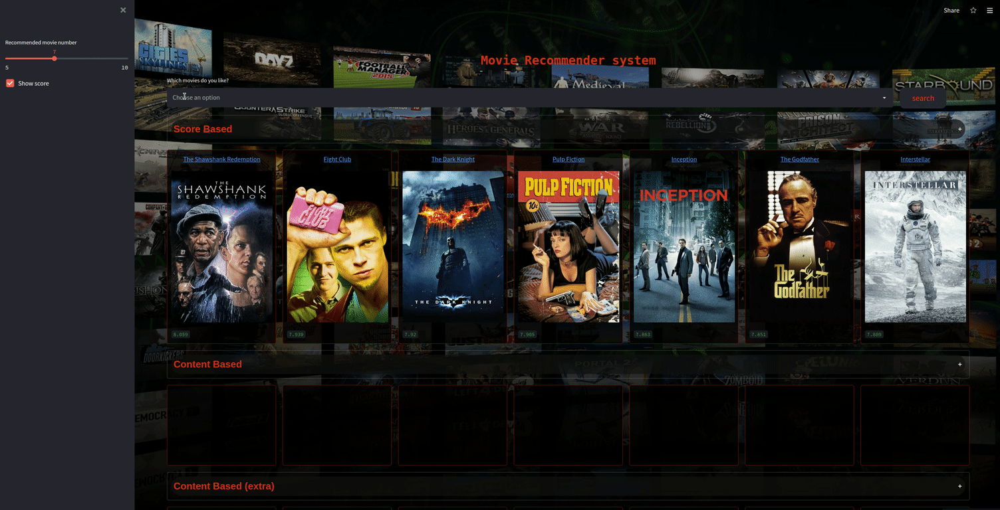 -->

# **Imports** <a class="anchor" id="Imports"></a>

In [ ]:
from collections import defaultdict, Counter
from functools import partial
import json
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import pandas as pd
from pandas_profiling import ProfileReport
from pywaffle import Waffle
import squarify
import scipy
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from wordcloud import WordCloud

pd.set_option("display.max_columns", None)
%matplotlib inline

# **Load Data** <a class="anchor" id="Load_Data"></a>

In [ ]:
PATH = "../data"
print(os.listdir(PATH))

In [ ]:
credit = pd.read_csv(os.path.join(PATH, 'tmdb_5000_credits.csv'))
movie = pd.read_csv(os.path.join(PATH, 'tmdb_5000_movies.csv'))

In [ ]:
credit.head(1)

In [ ]:
movie.head(1)

In [ ]:
# merge this two dataset
credit.columns = ['id','tittle','cast','crew']
movie_df = movie.merge(credit, on='id')
del movie
del credit

In [ ]:
movie_df.head(1)

# **Data preparation** <a class="anchor" id="Data_preparation"></a>

In [ ]:
# # the fastest way to get familiarize dataset and see much information
report = ProfileReport(movie_df)
report

In [ ]:
# convert date appropriate format
movie_df["release_date"] = pd.to_datetime(movie_df['release_date'])
movie_df['release_year'] = movie_df['release_date'].dt.year
movie_df['release_month'] = movie_df['release_date'].dt.month_name()
del movie_df["release_date"]

In [ ]:
# transform all columns which had json string into json format
# several columns has id and name
# leave only name for them beacause id is not so important in this case
json_columns = {'cast', 'crew', 'genres', 'keywords', 'production_countries', 
                'production_companies', 'spoken_languages'}

for c in json_columns:
    movie_df[c] = movie_df[c].apply(json.loads)
    if c != "crew": # We need other information besides the name
        movie_df[c] = movie_df[c].apply(lambda row: [x["name"] for x in row])

In [ ]:
# create director writer and producer columns 
def get_job(job, row):
    person_name = [x['name'] for x in row if x['job']==job] 
    return person_name[0] if len(person_name) else np.nan

movie_df["director"] = movie_df["crew"].apply(partial(get_job, "Director"))
movie_df["writer"]   = movie_df["crew"].apply(partial(get_job, "Writer"))
movie_df["producer"] = movie_df["crew"].apply(partial(get_job, "Producer"))
del movie_df["crew"]

In [ ]:
# create profit column
movie_df["profit"] = movie_df["revenue"] - movie_df["budget"]

In [ ]:
# fill some missing values by most frequent one
for col in ["runtime", "release_year", "release_month"]:
    movie_df[col] = movie_df[col].fillna(movie_df[col].mode().iloc[0])

In [ ]:
movie_df.head(2)

In [ ]:
C = movie_df['vote_average'].mean()
m = movie_df['vote_count'].quantile(0.9)
C, m

In [ ]:
q_movies = movie_df.copy().loc[movie_df['vote_count'] >= m]
q_movies.shape

In [ ]:
def weighted_rating(x, m=m, C=C):
    v = x['vote_count']
    R = x['vote_average']
    return (v/(v+m) * R) + (m/(m+v) * C)

In [ ]:
q_movies['score'] = q_movies.apply(weighted_rating, axis=1)
q_movies = q_movies.sort_values('score', ascending=False)
q_movies[['title', 'vote_count', 'vote_average', 'score']].head(5)

In [ ]:
with open('../data/movie_scores.pickle', 'wb') as handle:
    pickle.dump(q_movies[['id', 'title','score']], handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
movie_df['overview'].head(3)

In [ ]:
tfidf = TfidfVectorizer(stop_words='english')

movie_df['overview'] = movie_df['overview'].fillna('')

tfidf_matrix = tfidf.fit_transform(movie_df['overview'])
tfidf_matrix.shape

In [ ]:
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)
indices = pd.Series(movie_df.index, index=movie_df['title']).drop_duplicates()

In [ ]:
def get_recommendations(title, cosine_sim=cosine_sim):
    idx = indices[title]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:6]
    movie_indices = [i[0] for i in sim_scores]
    movie_similarity = [i[1] for i in sim_scores]

    return pd.DataFrame(zip(movie_df['title'].iloc[movie_indices], movie_similarity), columns=["title", "similarity"])

In [ ]:
get_recommendations('The Godfather: Part II')

In [ ]:
get_recommendations('The Avengers')

In [ ]:
get_recommendations('Pulp Fiction')

In [ ]:
# save data for future use
scipy.sparse.save_npz('../data/tfidf_matrix.npz', tfidf_matrix)

with open('../data/movie_df.pickle', 'wb') as handle:
    pickle.dump(movie_df[["id","title"]], handle, protocol=pickle.HIGHEST_PROTOCOL)

### Content based with more features <a class="anchor" id="Content_based_with_more_features"></a>

In [ ]:
# leave only top values for some features
# for example we dont need to take all casts
features = ['cast', 'keywords', 'genres']
top_num = 5
for feature in features:
    movie_df[feature] = movie_df[feature].apply(lambda x: x[:top_num] if isinstance(x, list) else [])

In [ ]:
# remove spaces for some features
# because we don't need "Johnny Depp" and "Johnny Galecki" as the same
def clean_data(x):
    if isinstance(x, list):
        return [str.lower(i.replace(" ", "")) for i in x]
    elif isinstance(x, str):
        return str.lower(x.replace(" ", ""))
    else:
        return ''
    
features = ['cast', 'keywords', 'genres', 'director', "writer", "producer", "production_companies", "production_countries"]

for feature in features:
    movie_df[feature] = movie_df[feature].apply(clean_data)

In [ ]:
def create_joined_features(x):
    return ' '.join([' '.join(x[f]) if isinstance(x[f], list) else str(x[f]) for f in features])

movie_df["join_features"] = movie_df.apply(create_joined_features, axis=1)

In [ ]:
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(movie_df['join_features'])
count_matrix.shape

In [ ]:
cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

movie_df = movie_df.reset_index()
indices = pd.Series(movie_df.index, index=movie_df['title'])

In [ ]:
get_recommendations('The Godfather: Part II', cosine_sim2)

In [ ]:
get_recommendations('The Avengers', cosine_sim2)

In [ ]:
get_recommendations('Pulp Fiction', cosine_sim2)

In [ ]:
# save matrix for future use
scipy.sparse.save_npz('../data/count_matrix.npz', count_matrix)